<a href="https://colab.research.google.com/github/AISoltani/CNN_Visualization/blob/main/CNN_VL_Res50.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Importing Modules and Libraries

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import cv2 as cv
import argparse
from torchvision import models, transforms

# Load  ResNet-50 Model

In [ ]:
# load the model
model = models.resnet50(pretrained=True)
print(model)
model_weights = [] # we will save the conv layer weights in this list
conv_layers = [] # we will save the 49 conv layers in this list
# get all the model children as list
model_children = list(model.children())

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

# retrieve all the convolutional layers and their weights

In [ ]:
# counter to keep count of the conv layers
counter = 0 
# append all the conv layers and their respective weights to the list
for i in range(len(model_children)):
    if type(model_children[i]) == nn.Conv2d:
        counter += 1
        model_weights.append(model_children[i].weight)
        conv_layers.append(model_children[i])
    elif type(model_children[i]) == nn.Sequential:
        for j in range(len(model_children[i])):
            for child in model_children[i][j].children():
                if type(child) == nn.Conv2d:
                    counter += 1
                    model_weights.append(child.weight)
                    conv_layers.append(child)
print(f"Total convolutional layers: {counter}")

Total convolutional layers: 49


In [ ]:
# take a look at the conv layers and the respective weights
for weight, conv in zip(model_weights, conv_layers):
    #print(f"WEIGHT: {weight} \nSHAPE: {weight.shape}")
    print(f"CONV: {conv} ====> SHAPE: {weight.shape}")

CONV: Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False) ====> SHAPE: torch.Size([64, 3, 7, 7])
CONV: Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False) ====> SHAPE: torch.Size([64, 64, 1, 1])
CONV: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False) ====> SHAPE: torch.Size([64, 64, 3, 3])
CONV: Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False) ====> SHAPE: torch.Size([256, 64, 1, 1])
CONV: Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1), bias=False) ====> SHAPE: torch.Size([64, 256, 1, 1])
CONV: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False) ====> SHAPE: torch.Size([64, 64, 3, 3])
CONV: Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False) ====> SHAPE: torch.Size([256, 64, 1, 1])
CONV: Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1), bias=False) ====> SHAPE: torch.Size([64, 256, 1, 1])
CONV: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False

# Visualizing Convolutional Layer Filters

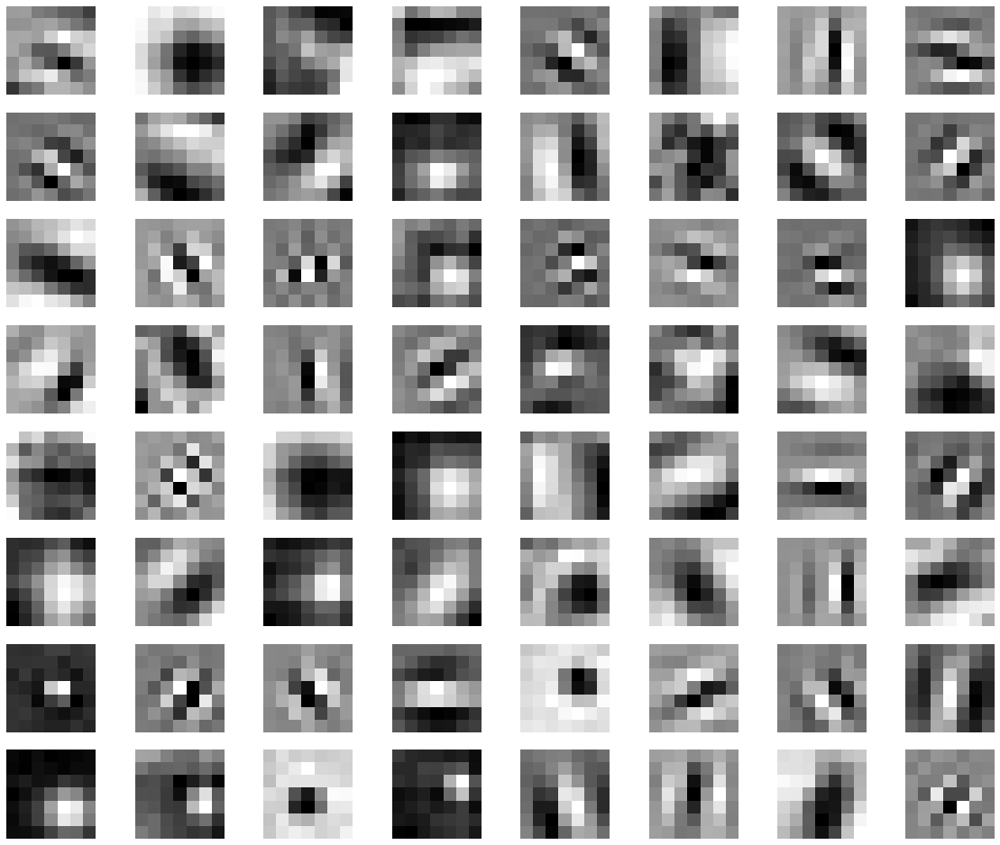

In [ ]:
# visualize the first conv layer filters
plt.figure(figsize=(20, 17))
for i, filter in enumerate(model_weights[0]):
    plt.subplot(8, 8, i+1) # (8, 8) because in conv0 we have 7x7 filters and total of 64 (see printed shapes)
    plt.imshow(filter[0, :, :].detach(), cmap='gray')
    plt.axis('off')
    plt.savefig('/content/CNN/outputs/filter.png')
plt.show()

# Reading the Image and Defining the Transforms

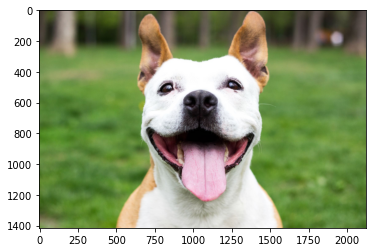

torch.Size([3, 512, 512])
torch.Size([1, 3, 512, 512])


In [ ]:
# read and visualize an image
from google.colab.patches import cv2_imshow
img = cv.imread(f"/content/CNN/input/dog.jpg")

img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()
# define the transforms
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
])
img = np.array(img)
# apply the transforms
img = transform(img)
print(img.size())
# unsqueeze to add a batch dimension
img = img.unsqueeze(0)
print(img.size())

# Passing the Input Image Through Each Convolutional Layer

In [ ]:
# pass the image through all the layers
results = [conv_layers[0](img)]
for i in range(1, len(conv_layers)):
    # pass the result from the last layer to the next layer
    results.append(conv_layers[i](results[-1]))
# make a copy of the `results`
outputs = results
print(outputs)

[tensor([[[[-4.4857e-01, -4.2276e-01, -4.2496e-01,  ..., -6.0724e-01,
           -6.2733e-01, -3.0340e-01],
          [-2.9160e-02, -2.9771e-02, -3.8554e-02,  ..., -5.0810e-02,
           -4.1493e-02, -7.1201e-02],
          [-2.4360e-02, -1.7726e-02, -2.6829e-02,  ..., -3.5677e-02,
           -4.7016e-02, -5.1597e-02],
          ...,
          [-7.5675e-02, -3.7158e-02, -7.2789e-02,  ..., -1.8837e-02,
           -1.7361e-02, -4.1798e-02],
          [-7.0496e-02, -4.1022e-02, -5.5461e-02,  ..., -1.7538e-03,
            2.0669e-03, -2.3100e-02],
          [-4.6654e-01, -9.1343e-01, -9.6527e-01,  ..., -7.0495e-01,
           -6.5595e-01, -6.9404e-01]],

         [[-1.7348e-02, -2.3602e-02,  7.2901e-03,  ..., -1.1247e-01,
           -1.1229e-01, -3.7821e-02],
          [-1.6324e-02, -1.5297e-02,  2.1025e-02,  ..., -1.0308e-01,
           -1.0096e-01, -2.1997e-02],
          [-6.6160e-03, -7.2149e-03,  3.0174e-02,  ..., -7.0091e-02,
           -6.6037e-02,  4.2148e-03],
          ...,
    

# Visualizing the Feature Maps

In [ ]:
# visualize 64 features from each layer 
# (although there are more feature maps in the upper layers)
for num_layer in range(len(outputs)):
    plt.figure(figsize=(30, 30))
    layer_viz = outputs[num_layer][0, :, :, :]
    layer_viz = layer_viz.data
    print(layer_viz.size())
    for i, filter in enumerate(layer_viz):
        if i == 64: # we will visualize only 8x8 blocks from each layer
            break
        plt.subplot(8, 8, i + 1)
        plt.imshow(filter, cmap='gray')
        plt.axis("off")
    print(f"Saving layer {num_layer} feature maps...")
    plt.savefig(f"/content/CNN/outputs/layer_{num_layer}.png")
    # plt.show()
    plt.close()

torch.Size([64, 256, 256])
Saving layer 0 feature maps...
torch.Size([64, 256, 256])
Saving layer 1 feature maps...
torch.Size([64, 256, 256])
Saving layer 2 feature maps...
torch.Size([256, 256, 256])
Saving layer 3 feature maps...
torch.Size([64, 256, 256])
Saving layer 4 feature maps...
torch.Size([64, 256, 256])
Saving layer 5 feature maps...
torch.Size([256, 256, 256])
Saving layer 6 feature maps...
torch.Size([64, 256, 256])
Saving layer 7 feature maps...
torch.Size([64, 256, 256])
Saving layer 8 feature maps...
torch.Size([256, 256, 256])
Saving layer 9 feature maps...
torch.Size([128, 256, 256])
Saving layer 10 feature maps...
torch.Size([128, 128, 128])
Saving layer 11 feature maps...
torch.Size([512, 128, 128])
Saving layer 12 feature maps...
torch.Size([128, 128, 128])
Saving layer 13 feature maps...
torch.Size([128, 128, 128])
Saving layer 14 feature maps...
torch.Size([512, 128, 128])
Saving layer 15 feature maps...
torch.Size([128, 128, 128])
Saving layer 16 feature maps.

In [ ]:
from IPython.display import Image

# Results

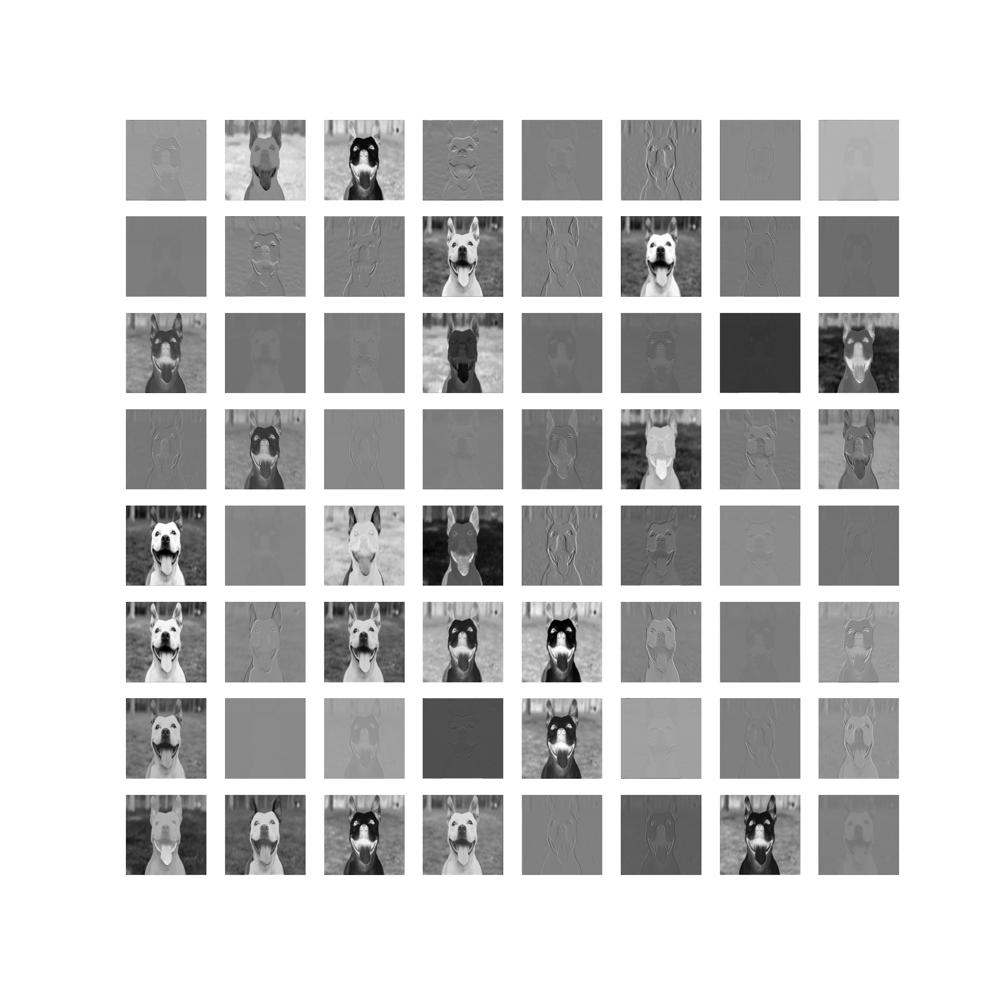

In [ ]:
display(Image("/content/CNN/outputs/layer_0.png", width=900, height=900))

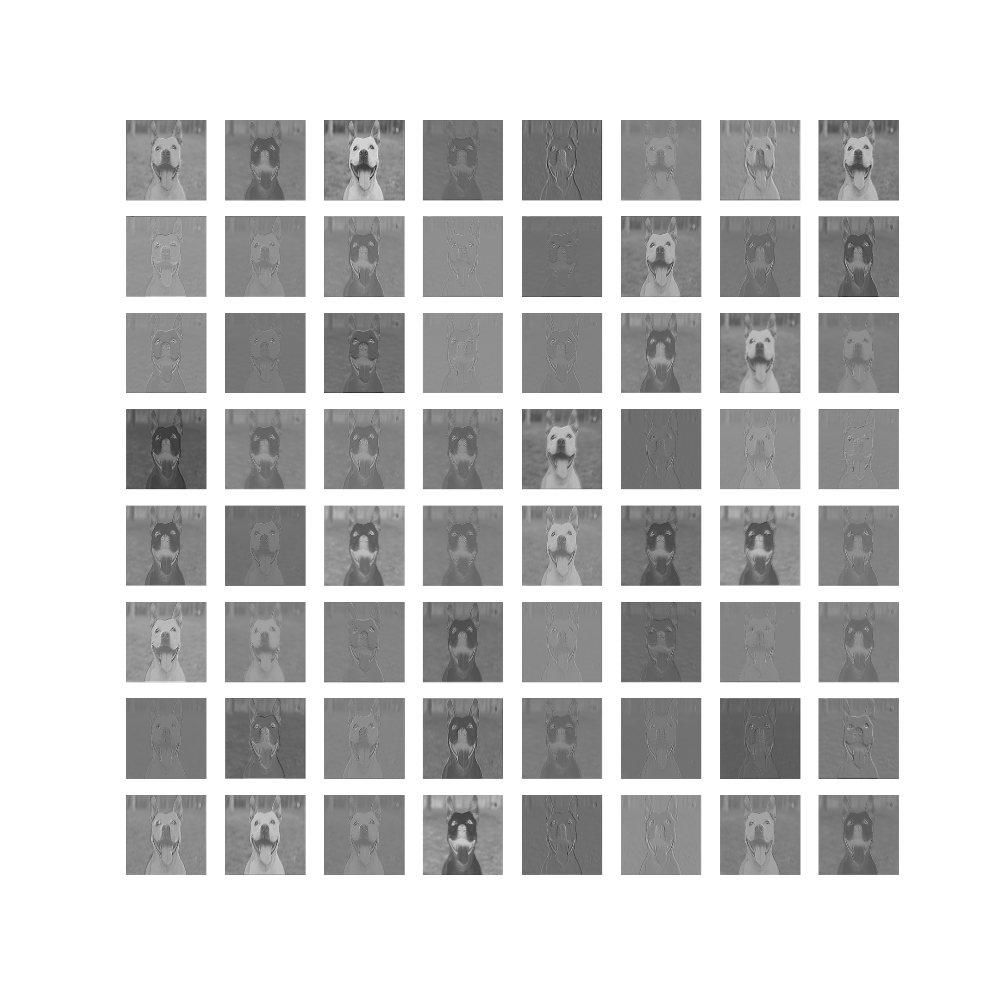

In [ ]:
display(Image("/content/CNN/outputs/layer_10.png", width=900, height=900))

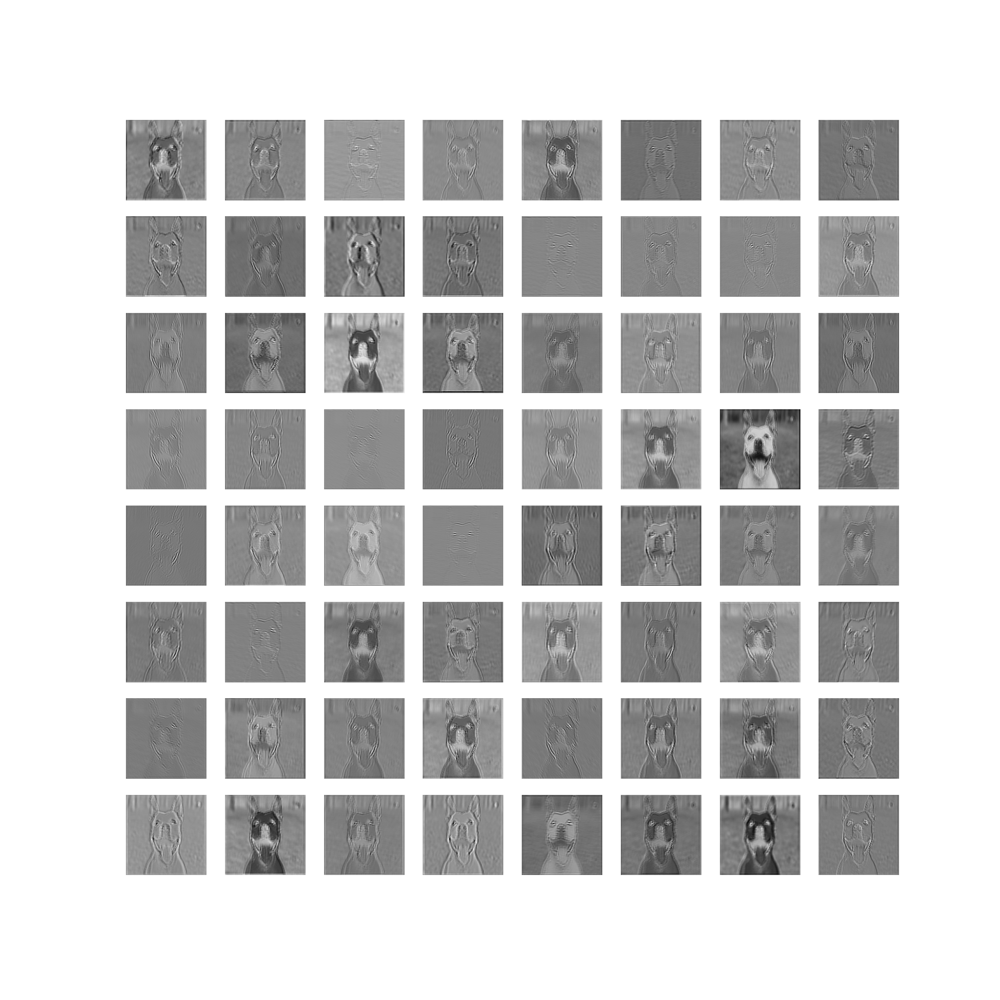

In [ ]:
display(Image("/content/CNN/outputs/layer_20.png", width=900, height=900))

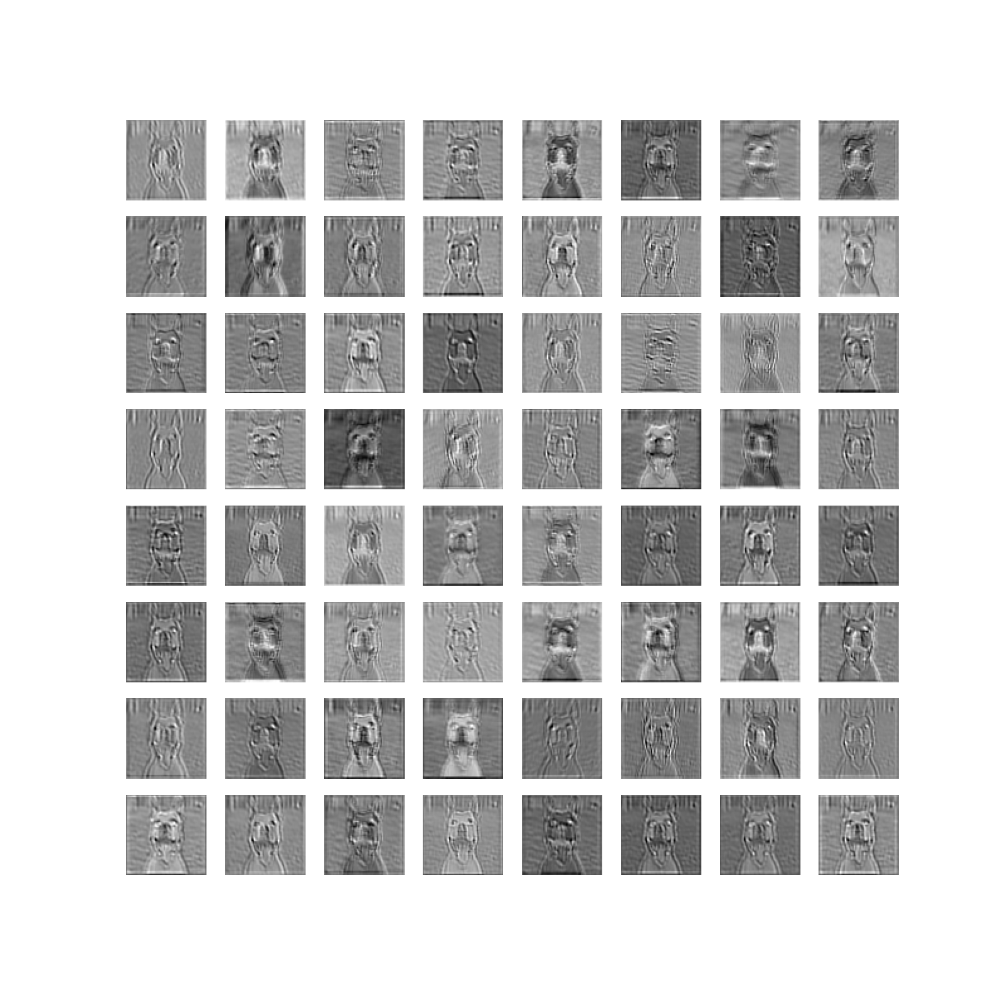

In [ ]:
display(Image("/content/CNN/outputs/layer_30.png", width=900, height=900))

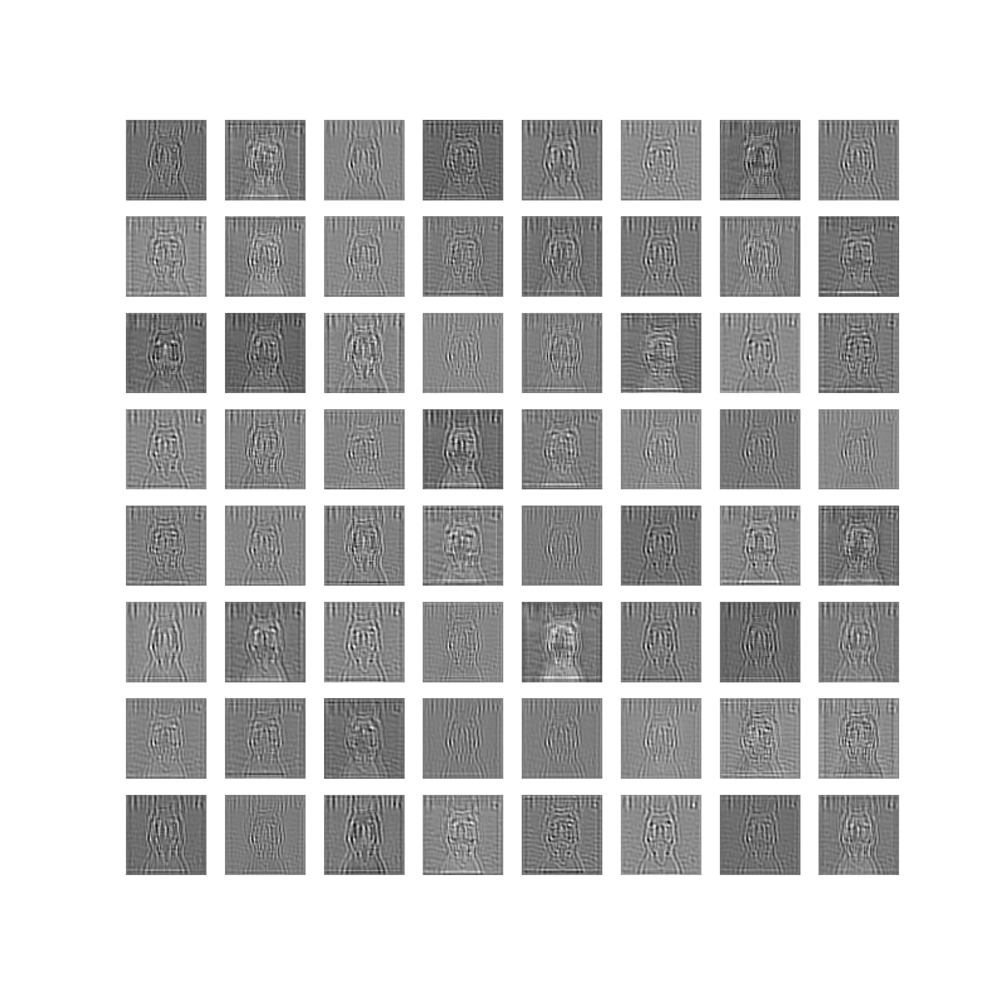

In [ ]:
display(Image("/content/CNN/outputs/layer_40.png", width=900, height=900))

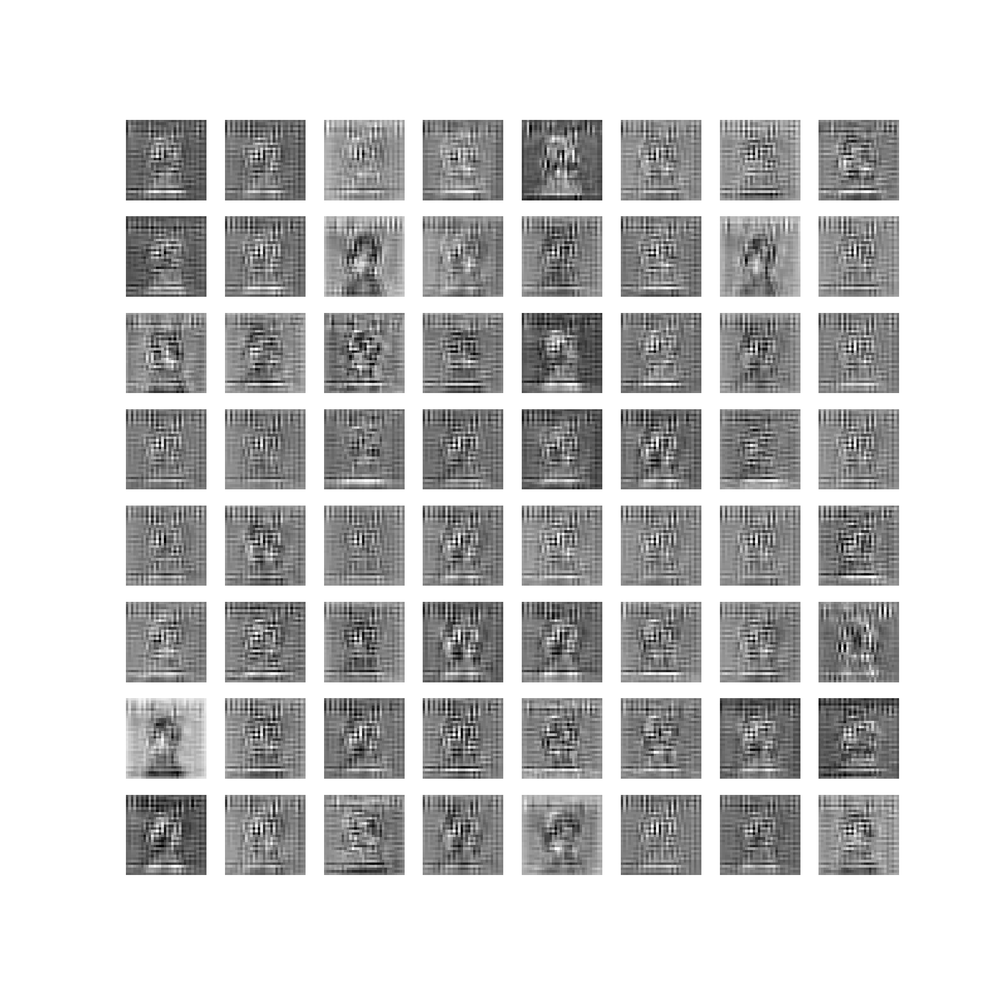

In [ ]:
display(Image("/content/CNN/outputs/layer_48.png", width=900, height=900))